In [9]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np


In [73]:
data_path = "/Users/fquareng/data/europe_dem_cropped.nc"

ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")


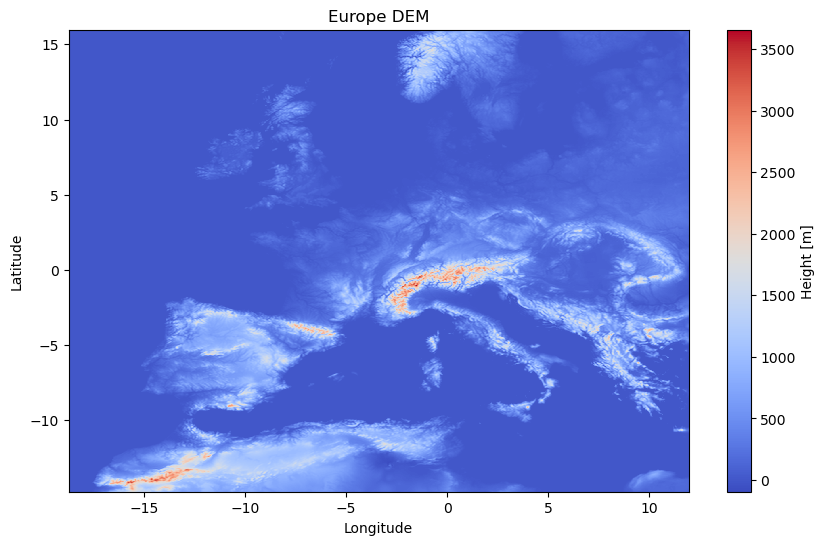

In [75]:
plt.figure(figsize=(10, 6))
plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')
plt.colorbar(label='Height [m]')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Europe DEM')
plt.show()

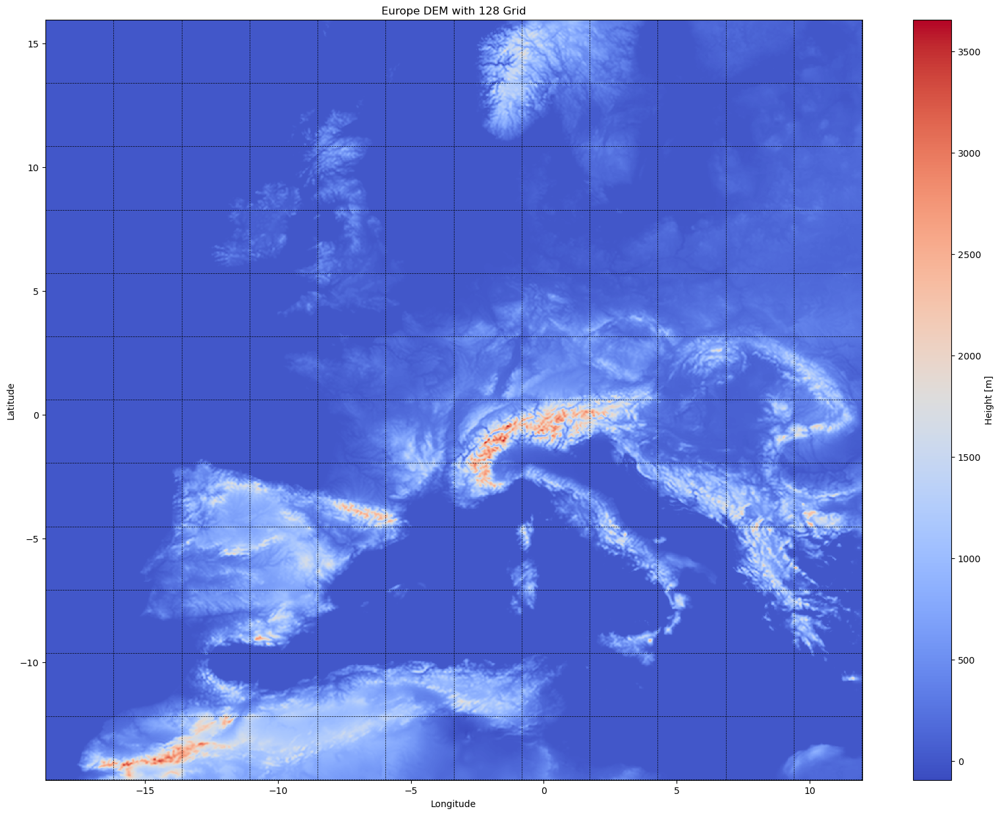

In [76]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Determine the extents of the plot
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

# Define grid properties
num_cells = 12  # 12x12 grid
rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

# Plot the DEM
plt.figure(figsize=(20, 15))
plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')
plt.colorbar(label='Height [m]')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Europe DEM with 128 Grid')

# Add grid lines
for i in range(num_cells + 1):
    # Vertical lines
    plt.axvline(x=rlon_min + i * rlon_grid_spacing, color='black', linestyle='--', linewidth=0.5)
    # Horizontal lines
    plt.axhline(y=rlat_min + i * rlat_grid_spacing, color='black', linestyle='--', linewidth=0.5)

plt.show()

In [77]:
import xarray as xr
import os

# Load the DEM dataset
ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Define the output directory
output_dir = "/Users/fquareng/data/dem_squares/"
os.makedirs(output_dir, exist_ok=True)

# Grid parameters
num_cells = 12  # Number of divisions along each axis
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

rlon_step = (rlon_max - rlon_min) / num_cells
rlat_step = (rlat_max - rlat_min) / num_cells

# Iterate through the grid and save each square
for i in range(num_cells):
    for j in range(num_cells):
        # Define the bounds for the current square
        rlon_start = rlon_min + i * rlon_step
        rlon_end = rlon_start + rlon_step
        rlat_start = rlat_min + j * rlat_step
        rlat_end = rlat_start + rlat_step
        
        # Crop the dataset
        square = hsurf.sel(
            rlon=slice(rlon_start, rlon_end),
            rlat=slice(rlat_start, rlat_end)
        )
        
        # Save the cropped square to a new NetCDF file
        output_path = os.path.join(output_dir, f"square_{i}_{j}.nc")
        square.to_netcdf(output_path)
        print(f"Saved: {output_path}")

print("All squares have been saved.")

Saved: /Users/fquareng/data/dem_squares/square_0_0.nc
Saved: /Users/fquareng/data/dem_squares/square_0_1.nc
Saved: /Users/fquareng/data/dem_squares/square_0_2.nc
Saved: /Users/fquareng/data/dem_squares/square_0_3.nc
Saved: /Users/fquareng/data/dem_squares/square_0_4.nc
Saved: /Users/fquareng/data/dem_squares/square_0_5.nc
Saved: /Users/fquareng/data/dem_squares/square_0_6.nc
Saved: /Users/fquareng/data/dem_squares/square_0_7.nc
Saved: /Users/fquareng/data/dem_squares/square_0_8.nc
Saved: /Users/fquareng/data/dem_squares/square_0_9.nc
Saved: /Users/fquareng/data/dem_squares/square_0_10.nc
Saved: /Users/fquareng/data/dem_squares/square_0_11.nc
Saved: /Users/fquareng/data/dem_squares/square_1_0.nc
Saved: /Users/fquareng/data/dem_squares/square_1_1.nc
Saved: /Users/fquareng/data/dem_squares/square_1_2.nc
Saved: /Users/fquareng/data/dem_squares/square_1_3.nc
Saved: /Users/fquareng/data/dem_squares/square_1_4.nc
Saved: /Users/fquareng/data/dem_squares/square_1_5.nc
Saved: /Users/fquareng/dat

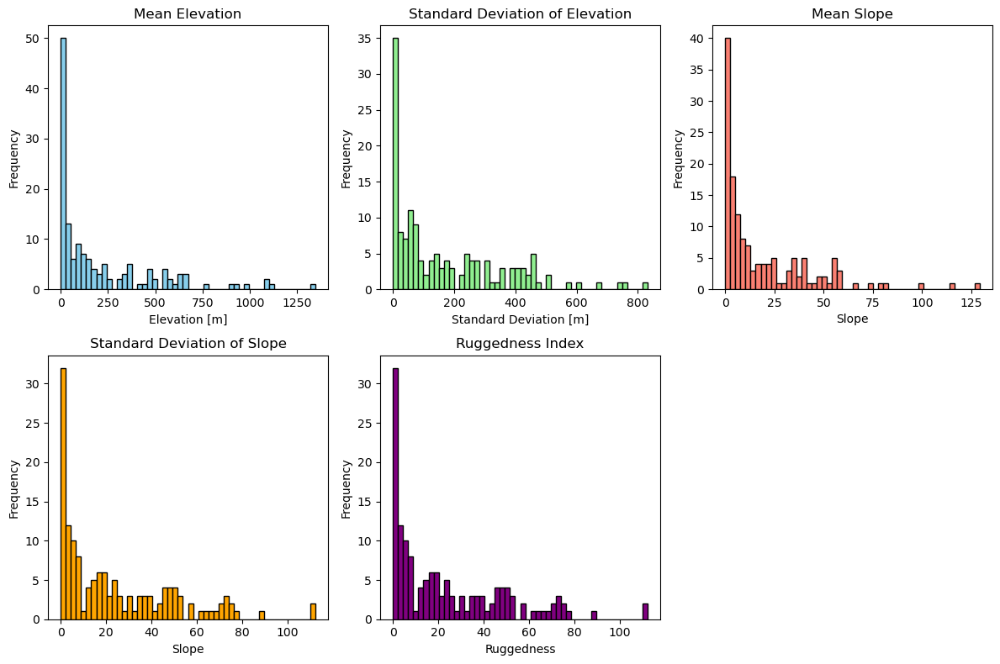

In [78]:
import xarray as xr
import numpy as np
import os
import matplotlib.pyplot as plt

# Define the directory containing DEM files
input_dir = "/Users/fquareng/data/dem_squares/"

# Define functions to compute terrain metrics
def compute_metrics(ds):
    """Compute mean elevation, standard deviation, and roughness metrics."""
    elevation = ds.values
    mean_elev = np.nanmean(elevation)
    std_dev = np.nanstd(elevation)
    
    # Compute gradients (slopes)
    grad_y, grad_x = np.gradient(elevation)
    slope = np.sqrt(grad_x**2 + grad_y**2)
    
    # Compute roughness metrics
    mean_slope = np.nanmean(slope)
    std_slope = np.nanstd(slope)
    ruggedness_index = np.sqrt(grad_x**2 + grad_y**2).std()
    
    return mean_elev, std_dev, mean_slope, std_slope, ruggedness_index

# Collect metrics for all files
metrics_list = []
for file_name in sorted(os.listdir(input_dir)):
    if file_name.endswith(".nc"):
        file_path = os.path.join(input_dir, file_name)
        with xr.open_dataset(file_path) as ds:
            hsurf = ds["HSURF"]  # Replace with the variable name in your DEM
            metrics = compute_metrics(hsurf)
            metrics_list.append(metrics)

# Convert metrics to separate lists
metrics_array = np.array(metrics_list)
mean_elevations = metrics_array[:, 0]
std_devs = metrics_array[:, 1]
mean_slopes = metrics_array[:, 2]
std_slopes = metrics_array[:, 3]
ruggedness_indices = metrics_array[:, 4]

# Plot distributions
plt.figure(figsize=(12, 8))

# Mean Elevation
plt.subplot(2, 3, 1)
plt.hist(mean_elevations, bins=50, color="skyblue", edgecolor="black")
plt.title("Mean Elevation")
plt.xlabel("Elevation [m]")
plt.ylabel("Frequency")

# Standard Deviation
plt.subplot(2, 3, 2)
plt.hist(std_devs, bins=50, color="lightgreen", edgecolor="black")
plt.title("Standard Deviation of Elevation")
plt.xlabel("Standard Deviation [m]")
plt.ylabel("Frequency")

# Mean Slope
plt.subplot(2, 3, 3)
plt.hist(mean_slopes, bins=50, color="salmon", edgecolor="black")
plt.title("Mean Slope")
plt.xlabel("Slope")
plt.ylabel("Frequency")

# Standard Deviation of Slope
plt.subplot(2, 3, 4)
plt.hist(std_slopes, bins=50, color="orange", edgecolor="black")
plt.title("Standard Deviation of Slope")
plt.xlabel("Slope")
plt.ylabel("Frequency")

# Ruggedness Index
plt.subplot(2, 3, 5)
plt.hist(ruggedness_indices, bins=50, color="purple", edgecolor="black")
plt.title("Ruggedness Index")
plt.xlabel("Ruggedness")
plt.ylabel("Frequency")

# Adjust layout
plt.tight_layout()
plt.show()

In [79]:
input_dir = "/Users/fquareng/data/dem_squares/"

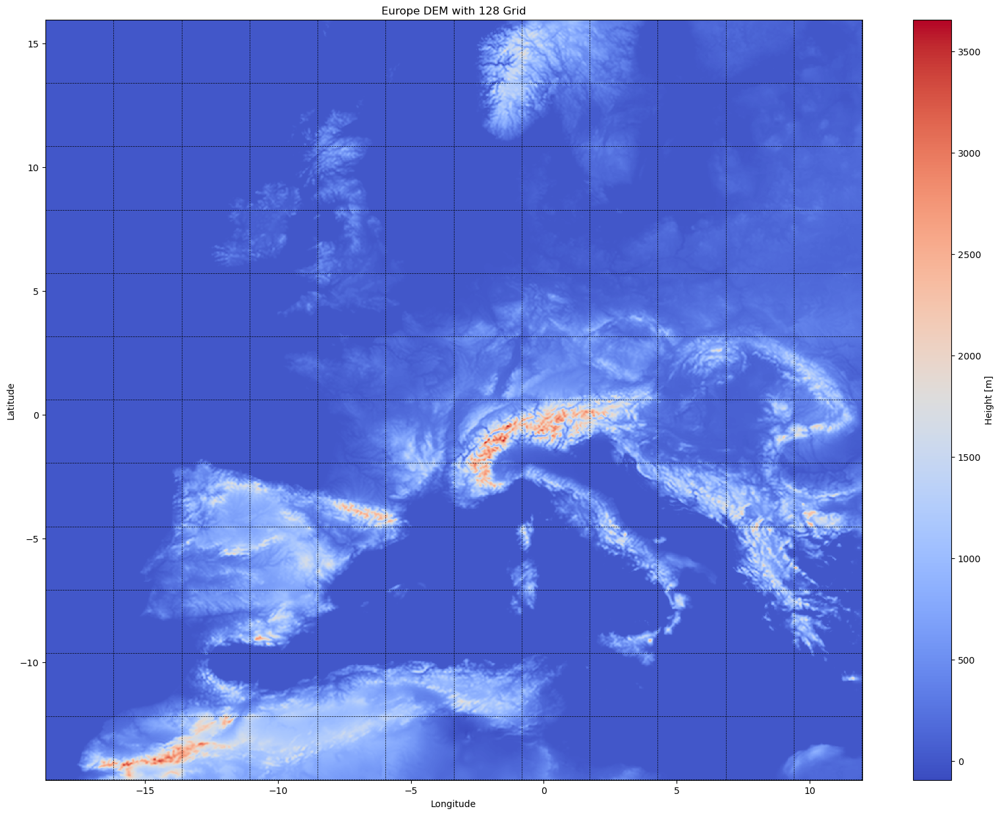

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Determine the extents of the plot
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

# Define grid properties
num_cells = 12  # 12x12 grid
rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

# Plot the DEM
plt.figure(figsize=(20, 15))
plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')
plt.colorbar(label='Height [m]')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Europe DEM with 128 Grid')

# Add grid lines
for i in range(num_cells + 1):
    # Vertical lines
    plt.axvline(x=rlon_min + i * rlon_grid_spacing, color='black', linestyle='--', linewidth=0.5)
    # Horizontal lines
    plt.axhline(y=rlat_min + i * rlat_grid_spacing, color='black', linestyle='--', linewidth=0.5)

plt.show()

In [86]:
ds.rlat[64::128]

<xarray.DataArray 'rlat' (rlat: 12)> Size: 48B
array([-13.46    , -10.9     ,  -8.34    ,  -5.78    ,  -3.22    ,  -0.66    ,
         1.9     ,   4.46    ,   7.02    ,   9.58    ,  12.139999,  14.7     ],
      dtype=float32)
Coordinates:
  * rlat     (rlat) float32 48B -13.46 -10.9 -8.34 -5.78 ... 9.58 12.14 14.7
Attributes:
    standard_name:  grid_latitude
    long_name:      rotated latitude
    units:          degrees

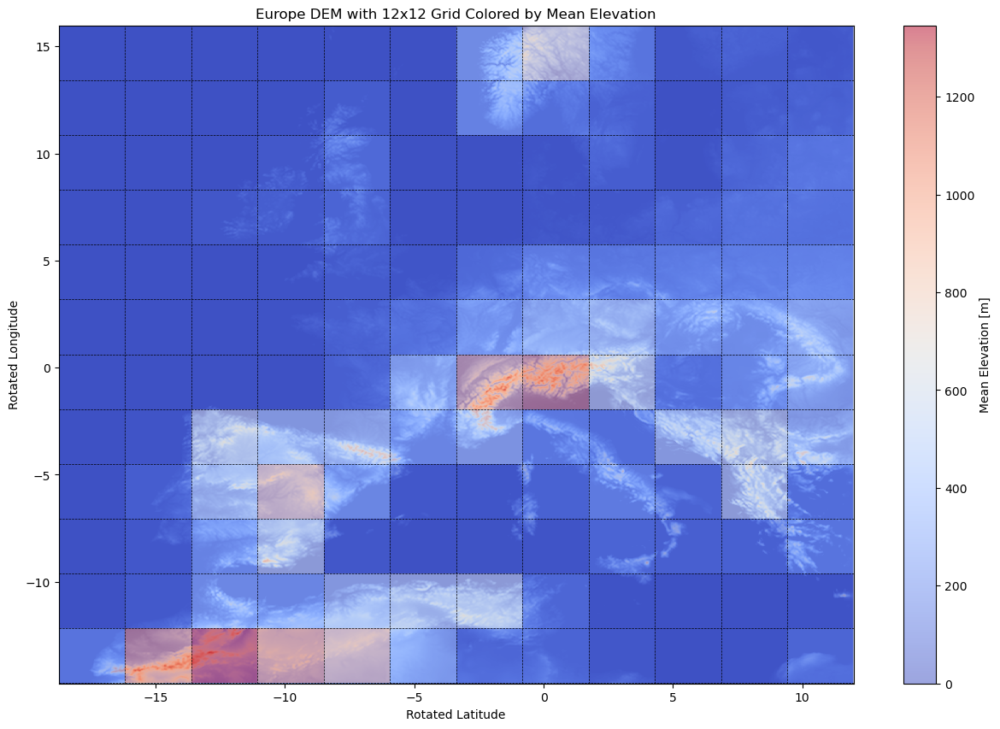

In [90]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load dataset
ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Determine the extents of the plot
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

# Define grid properties
num_cells = 12  # 12x12 grid
rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

# Initialize an array to store the mean elevation values for each grid cell
mean_elevations = np.full((num_cells, num_cells), np.nan)

# Loop through each grid cell and calculate the mean elevation
for i in range(num_cells):
    for j in range(num_cells):
        # Determine the bounds of the current grid cell
        rlon_min_cell = rlon_min + i * rlon_grid_spacing
        rlon_max_cell = rlon_min + (i + 1) * rlon_grid_spacing
        rlat_min_cell = rlat_min + j * rlat_grid_spacing
        rlat_max_cell = rlat_min + (j + 1) * rlat_grid_spacing
        
        # Slice the hsurf data to the current grid cell
        cell_data = hsurf.sel(rlon=slice(rlon_min_cell, rlon_max_cell),
                              rlat=slice(rlat_min_cell, rlat_max_cell))
        
        # Calculate the mean elevation for the current grid cell
        mean_elevations[j, i] = cell_data.mean().item()

# Plot the DEM with colored grid squares based on mean elevation
plt.figure(figsize=(15, 10))
plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')
plt.pcolormesh(ds.rlon[64::128], ds.rlat[64::128], mean_elevations, cmap='coolwarm', shading='auto', alpha=.5)

# Add color bar
plt.colorbar(label='Mean Elevation [m]')

# Add grid lines and labels
for i, (lon, lat) in enumerate(zip(ds.rlon[::128], ds.rlat[::128])):
    # Vertical lines
    plt.axvline(x=lon, color='black', linestyle='--', linewidth=0.5)
    # Horizontal lines
    plt.axhline(y=lat, color='black', linestyle='--', linewidth=0.5)

# Set labels and title
plt.xlabel('Rotated Latitude')
plt.ylabel('Rotated Longitude')
plt.title('Europe DEM with 12x12 Grid Colored by Mean Elevation')

# Show the plot
plt.show()

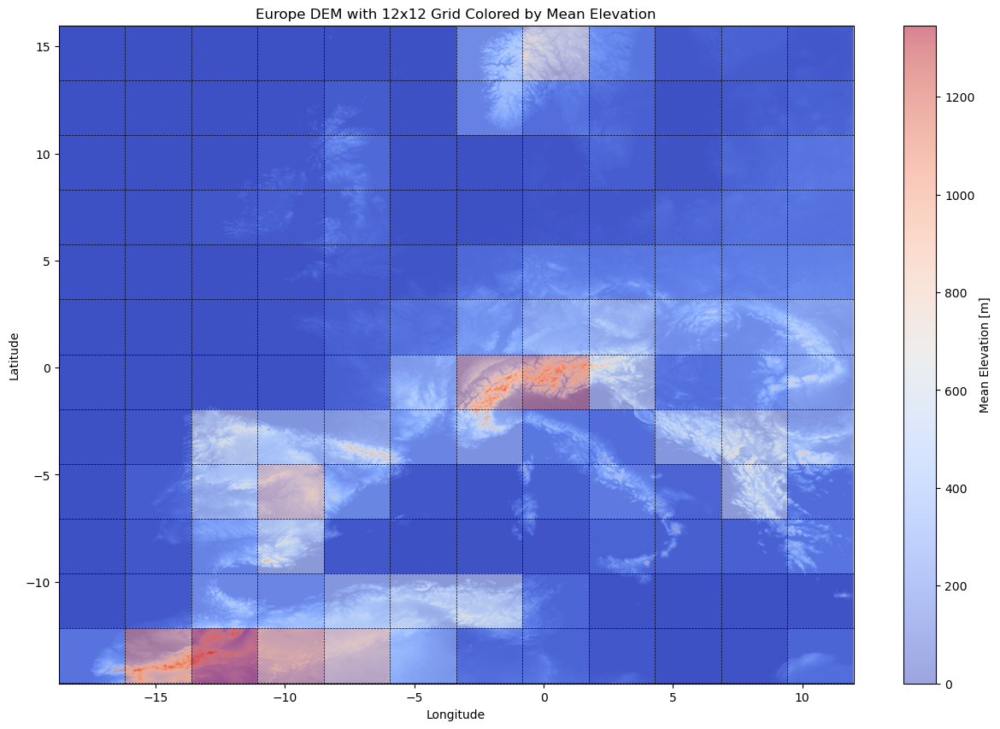

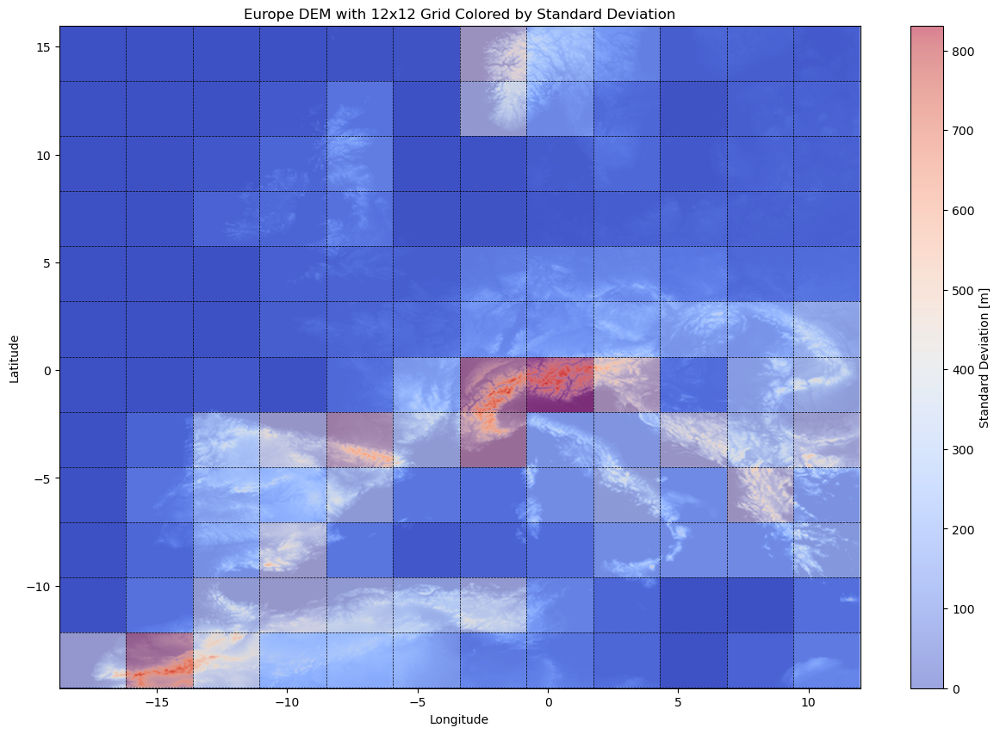

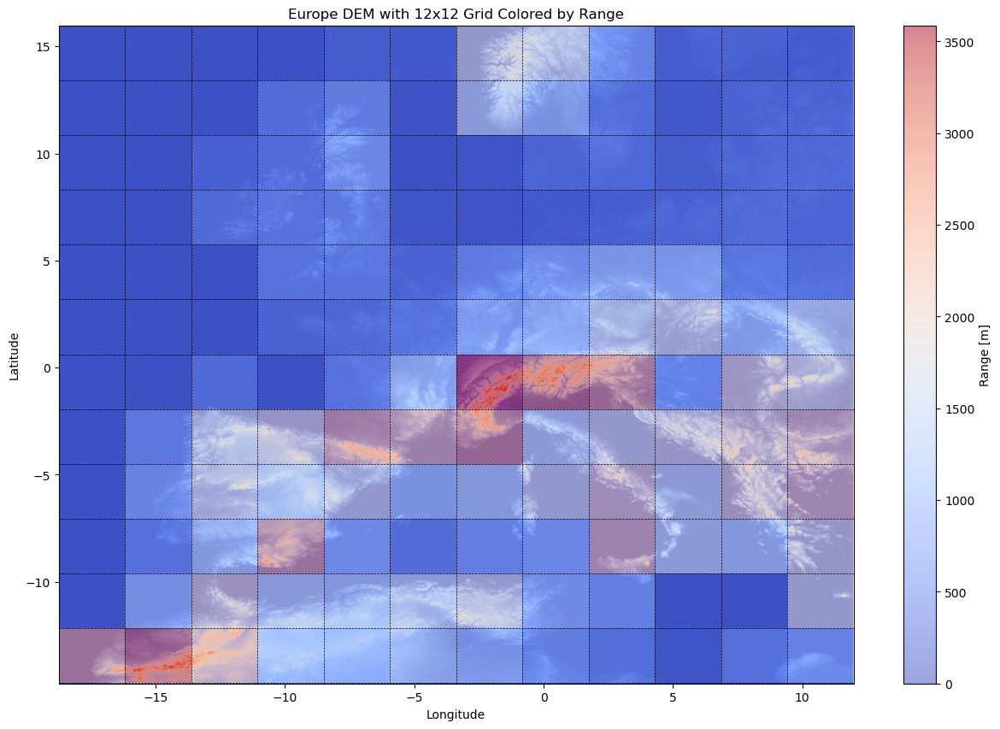

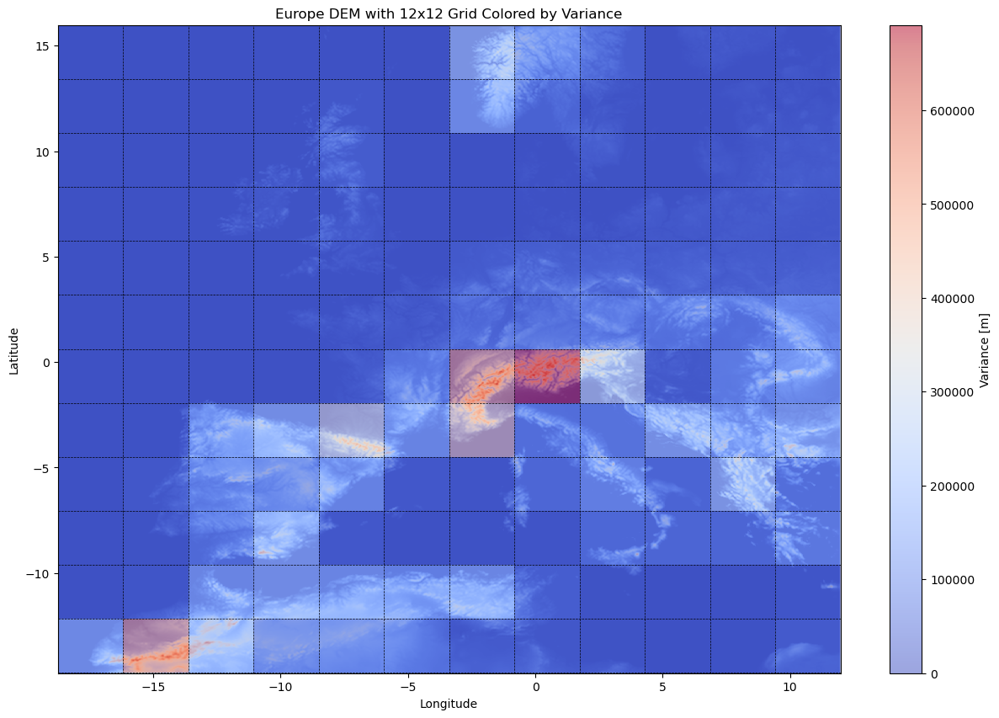

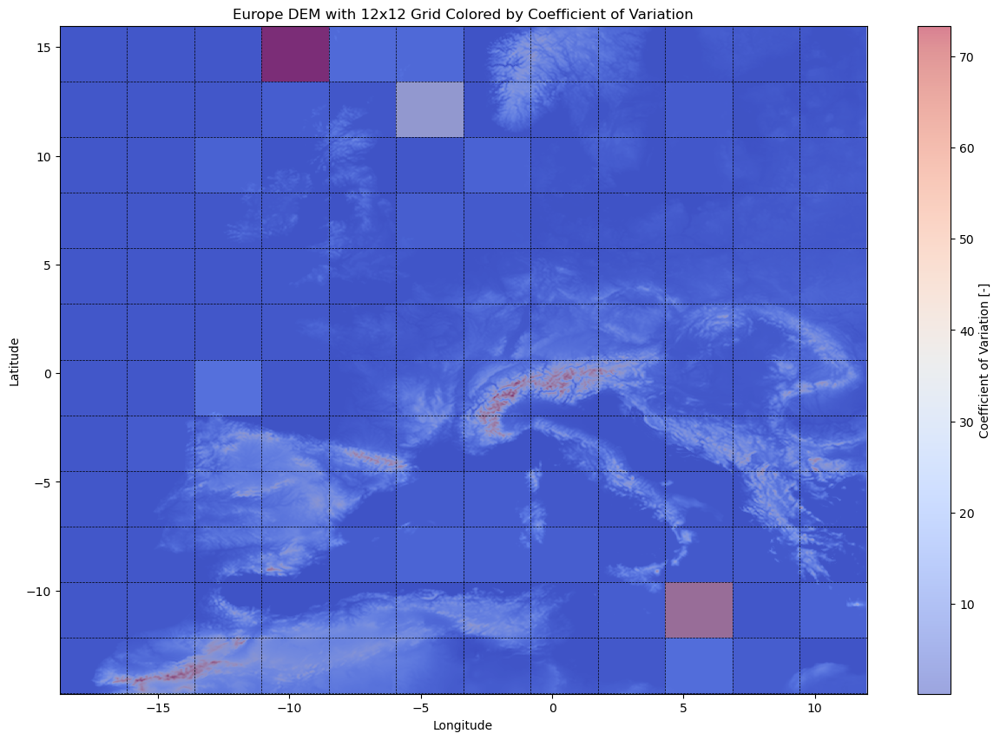

In [92]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load dataset
ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Determine the extents of the plot
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

# Define grid properties
num_cells = 12  # 12x12 grid
rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

# Initialize arrays to store the metrics for each grid cell
mean_elevations = np.full((num_cells, num_cells), np.nan)
std_devs = np.full((num_cells, num_cells), np.nan)
ranges = np.full((num_cells, num_cells), np.nan)
variances = np.full((num_cells, num_cells), np.nan)
cv = np.full((num_cells, num_cells), np.nan)  # Coefficient of Variation

# Loop through each grid cell and calculate the metrics
for i in range(num_cells):
    for j in range(num_cells):
        # Determine the bounds of the current grid cell
        rlon_min_cell = rlon_min + i * rlon_grid_spacing
        rlon_max_cell = rlon_min + (i + 1) * rlon_grid_spacing
        rlat_min_cell = rlat_min + j * rlat_grid_spacing
        rlat_max_cell = rlat_min + (j + 1) * rlat_grid_spacing
        
        # Slice the hsurf data to the current grid cell
        cell_data = hsurf.sel(rlon=slice(rlon_min_cell, rlon_max_cell),
                              rlat=slice(rlat_min_cell, rlat_max_cell))
        
        # Calculate the mean, std, range, variance, and coefficient of variation for the current grid cell
        mean_elevations[j, i] = cell_data.mean().item()
        std_devs[j, i] = cell_data.std().item()
        ranges[j, i] = cell_data.max().item() - cell_data.min().item()
        variances[j, i] = cell_data.var().item()
        cv[j, i] = std_devs[j, i] / mean_elevations[j, i] if mean_elevations[j, i] != 0 else np.nan

# Plot the DEM for each metric (mean elevation, standard deviation, range, variance, coefficient of variation)
metrics = [
    ("Mean Elevation", mean_elevations),
    ("Standard Deviation", std_devs),
    ("Range", ranges),
    ("Variance", variances),
    ("Coefficient of Variation", cv) # Coefficient of Variation (CV) (cv): This is the ratio of standard deviation to the mean (std / mean), and it’s useful for comparing roughness.
]

# Plot each metric
for metric_name, metric_values in metrics:
    plt.figure(figsize=(15, 10))
    
    # Plot DEM and overlay grid squares colored by the metric
    plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')
    plt.pcolormesh(ds.rlon[64::128], ds.rlat[64::128], metric_values, cmap='coolwarm', shading='auto', alpha=0.5)
    
    # Add color bar
    plt.colorbar(label=f'{metric_name} [m]' if "Coefficient" not in metric_name else f'{metric_name} [-]')
    
    # Add grid lines and labels
    for i, (lon, lat) in enumerate(zip(ds.rlon[::128], ds.rlat[::128])):
        plt.axvline(x=lon, color='black', linestyle='--', linewidth=0.5)
        plt.axhline(y=lat, color='black', linestyle='--', linewidth=0.5)

    # Set labels and title
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(f'Europe DEM with 12x12 Grid Colored by {metric_name}')
    
    # Show the plot
    plt.show()

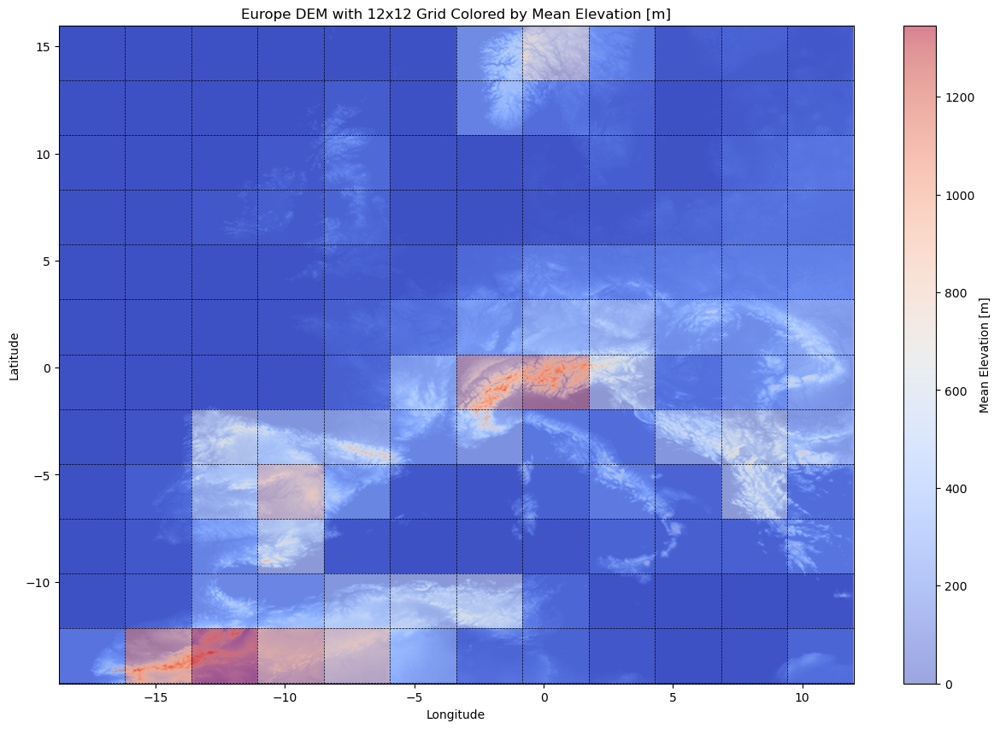

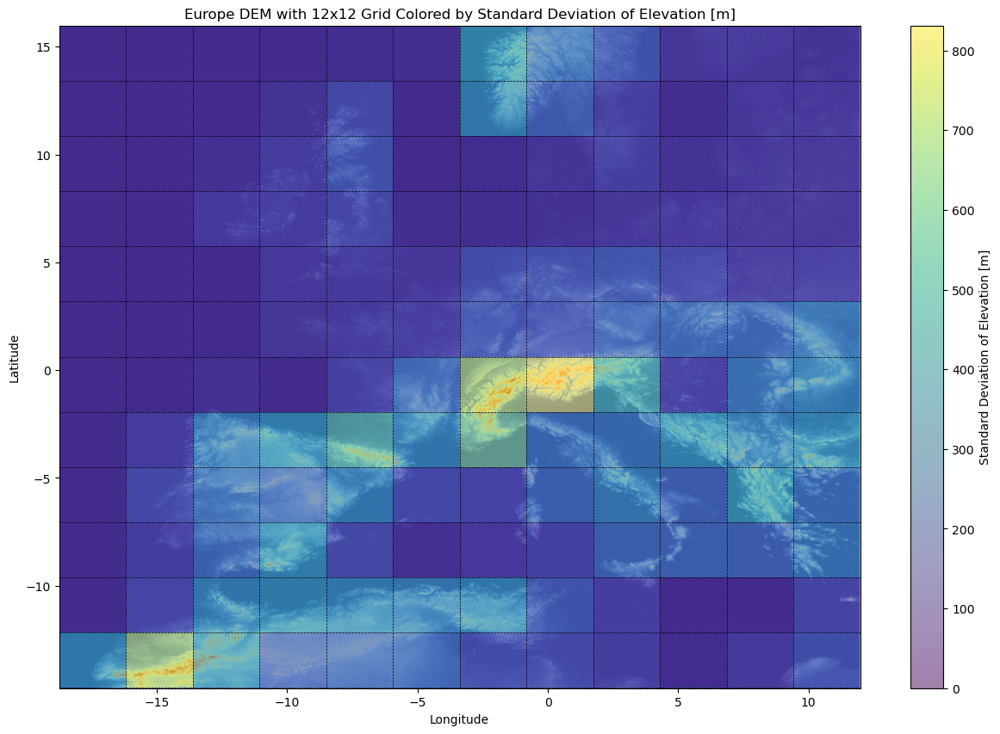

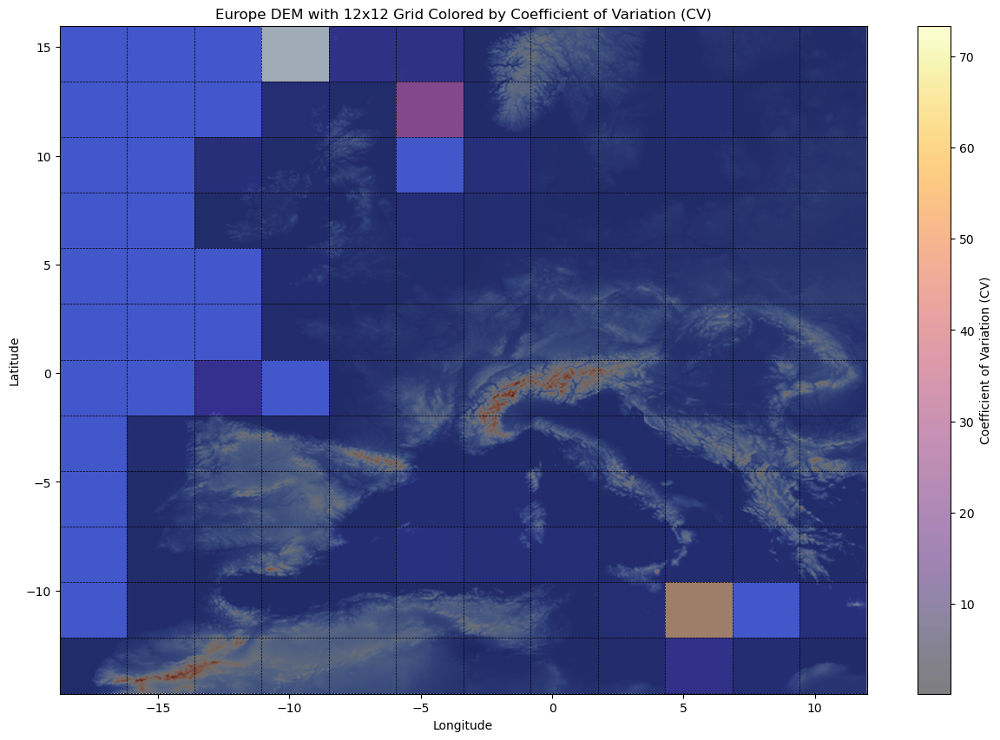

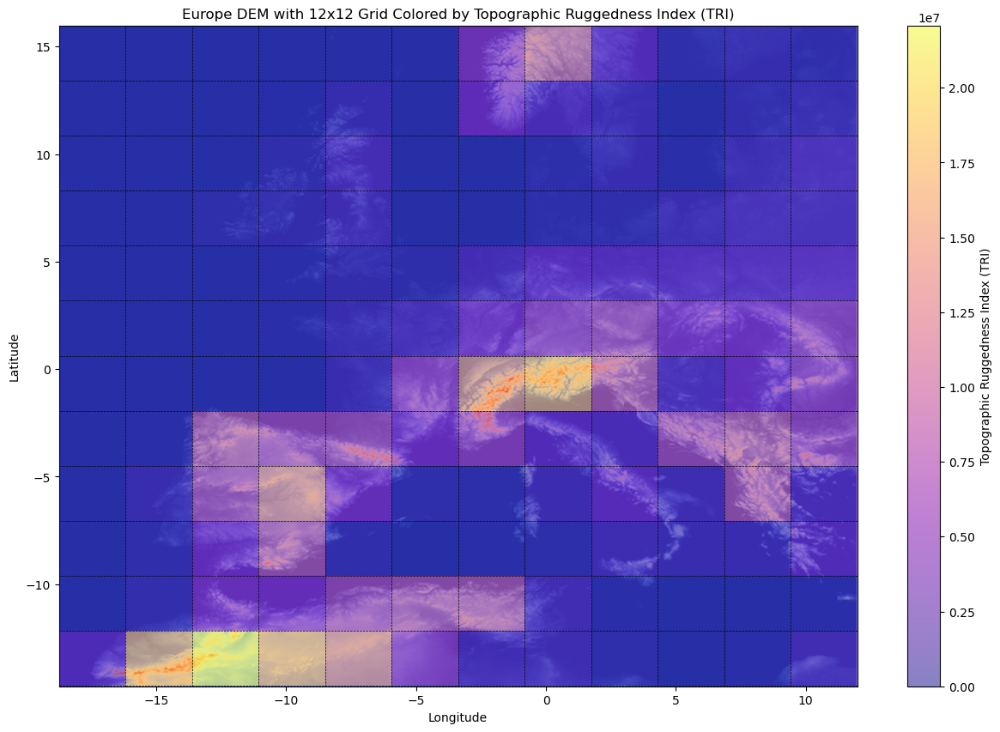

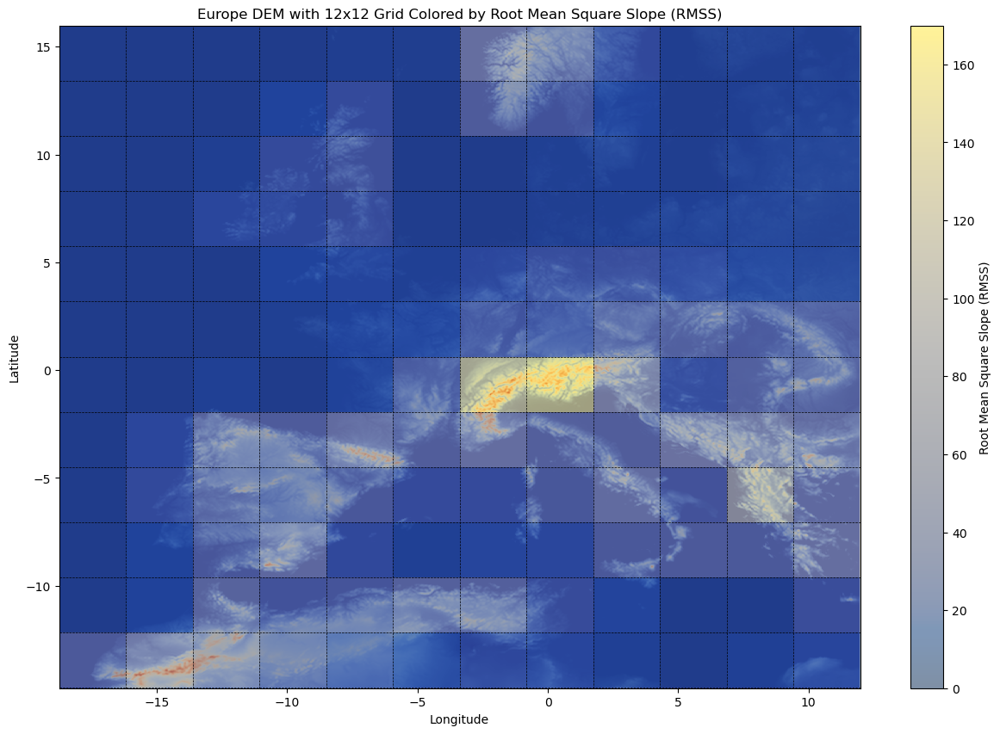

In [93]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load dataset
data_path = "/Users/fquareng/data/europe_dem_cropped.nc"
ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Determine the extents of the plot
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

# Define grid properties
num_cells = 12  # 12x12 grid
rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

# Initialize an array to store the mean elevation values for each grid cell
mean_elevations = np.full((num_cells, num_cells), np.nan)
std_devs = np.full((num_cells, num_cells), np.nan)
cv_values = np.full((num_cells, num_cells), np.nan)
tri_values = np.full((num_cells, num_cells), np.nan)
rmss_values = np.full((num_cells, num_cells), np.nan)

# Loop through each grid cell and calculate the mean elevation and roughness metrics
for i in range(num_cells):
    for j in range(num_cells):
        # Determine the bounds of the current grid cell
        rlon_min_cell = rlon_min + i * rlon_grid_spacing
        rlon_max_cell = rlon_min + (i + 1) * rlon_grid_spacing
        rlat_min_cell = rlat_min + j * rlat_grid_spacing
        rlat_max_cell = rlat_min + (j + 1) * rlat_grid_spacing
        
        # Slice the hsurf data to the current grid cell
        cell_data = hsurf.sel(rlon=slice(rlon_min_cell, rlon_max_cell),
                              rlat=slice(rlat_min_cell, rlat_max_cell))
        
        # Calculate the mean elevation for the current grid cell
        mean_elevations[j, i] = cell_data.mean().item()

        # Calculate the standard deviation for the current grid cell
        std_devs[j, i] = cell_data.std().item()

        # Calculate the coefficient of variation (CV) for the current grid cell
        cv_values[j, i] = std_devs[j, i] / mean_elevations[j, i] if mean_elevations[j, i] != 0 else np.nan
        
        # Calculate the Topographic Ruggedness Index (TRI)
        tri_cell_data = np.abs(cell_data - cell_data.shift(rlon=1, fill_value=cell_data.mean()) -
                               cell_data.shift(rlat=1, fill_value=cell_data.mean()))
        tri_values[j, i] = tri_cell_data.sum().item()

        # Calculate the Root Mean Square Slope (RMSS)
        sx, sy = np.gradient(cell_data.values)
        slope = np.sqrt(sx**2 + sy**2)
        rmss_values[j, i] = np.sqrt(np.mean(slope**2))

# Plot the DEM with colored grid squares based on mean elevation and other metrics

# Define a function to plot each metric
def plot_metric(metric_values, title, cmap='coolwarm'):
    plt.figure(figsize=(15, 10))
    plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')  # Plot the DEM in the background
    plt.pcolormesh(ds.rlon[64::128], ds.rlat[64::128], metric_values, cmap=cmap, shading='auto', alpha=0.5)  # Overlay the metric
    plt.colorbar(label=title)
    
    # Add grid lines and labels
    for i, (lon, lat) in enumerate(zip(ds.rlon[::128], ds.rlat[::128])):
        plt.axvline(x=lon, color='black', linestyle='--', linewidth=0.5)
        plt.axhline(y=lat, color='black', linestyle='--', linewidth=0.5)

    # Set labels and title
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(f'Europe DEM with 12x12 Grid Colored by {title}')
    plt.show()

# Plotting each metric

# 1. Mean Elevation
plot_metric(mean_elevations, 'Mean Elevation [m]')

# 2. Standard Deviation of Elevation
plot_metric(std_devs, 'Standard Deviation of Elevation [m]', cmap='viridis')

# 3. Coefficient of Variation (CV)
plot_metric(cv_values, 'Coefficient of Variation (CV)', cmap='inferno')

# 4. Topographic Ruggedness Index (TRI)
plot_metric(tri_values, 'Topographic Ruggedness Index (TRI)', cmap='plasma')

# 5. Root Mean Square Slope (RMSS)
plot_metric(rmss_values, 'Root Mean Square Slope (RMSS)', cmap='cividis')

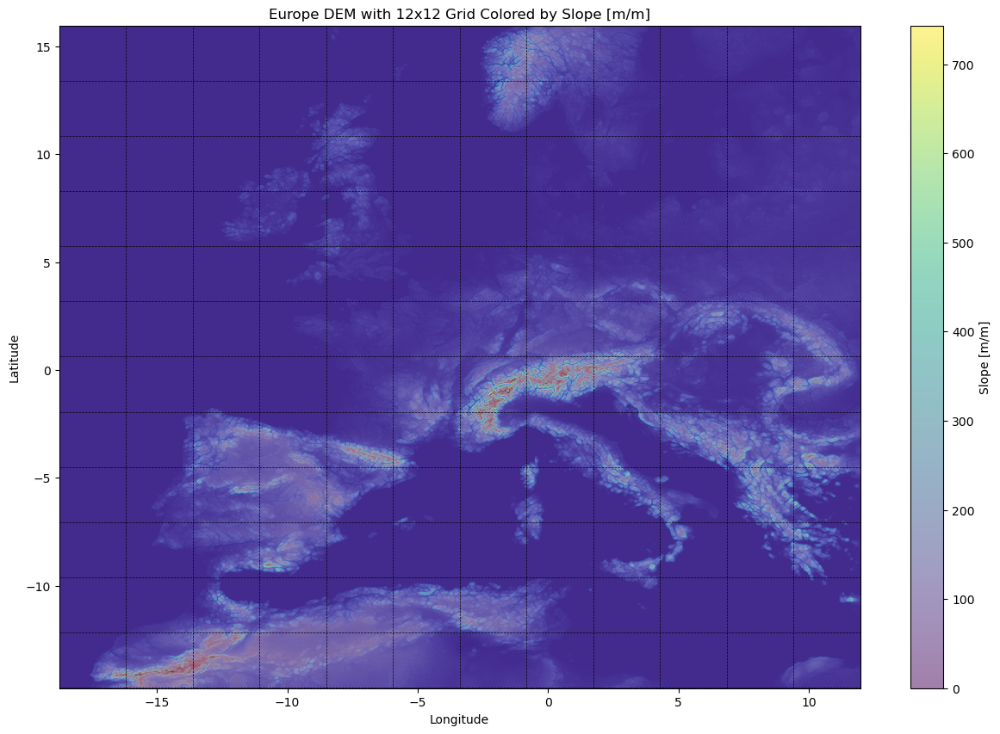

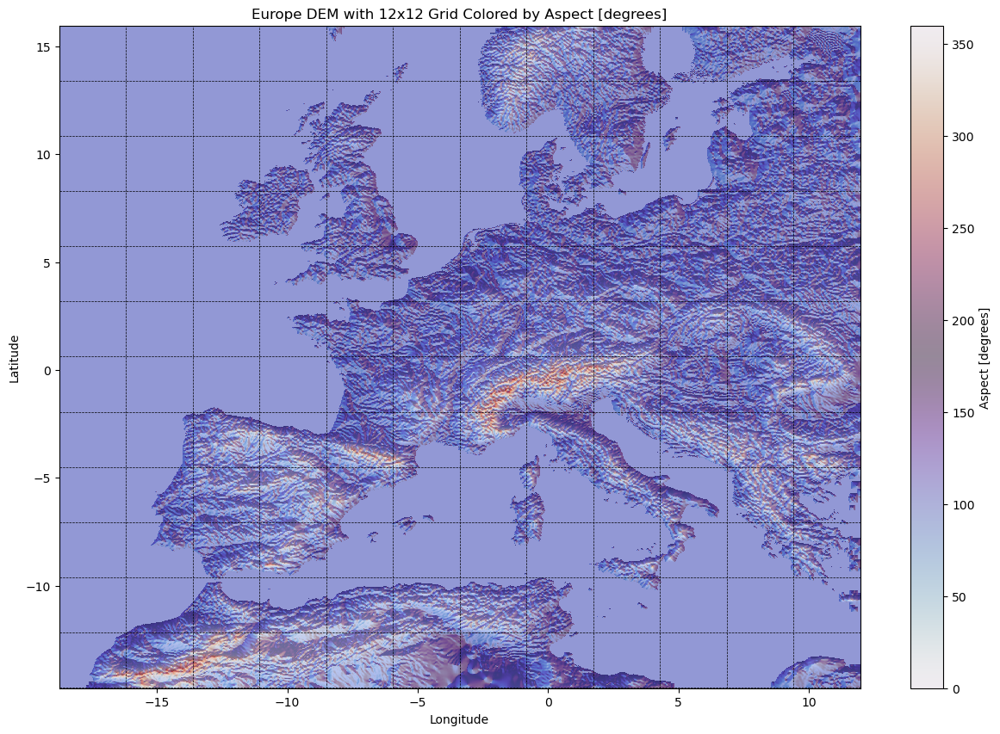

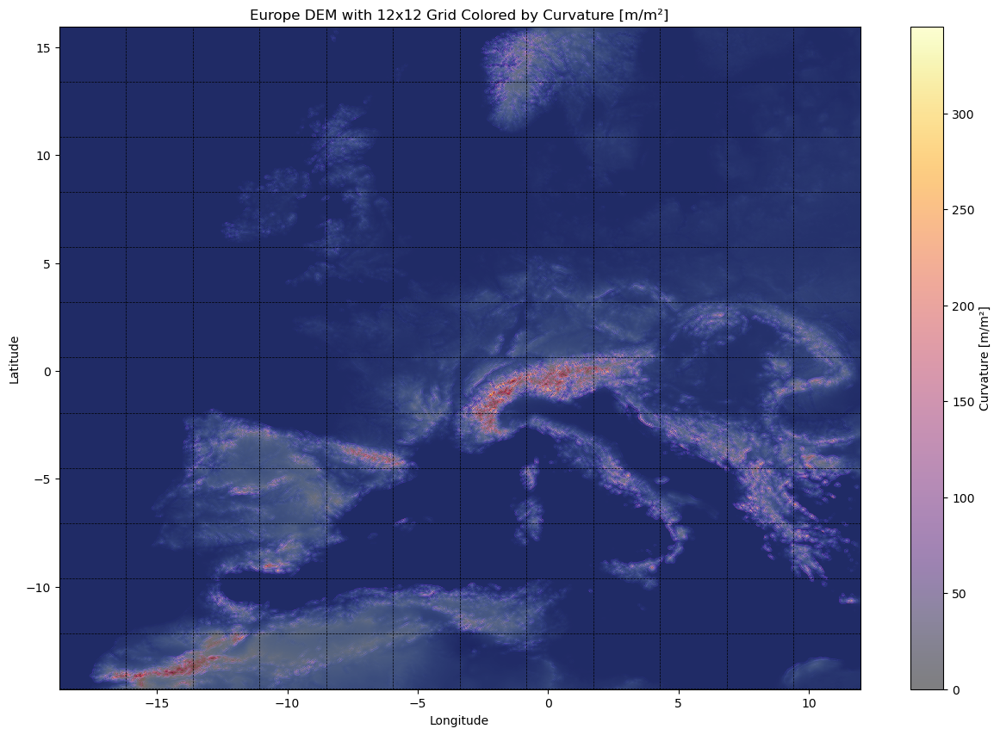

In [98]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load dataset
data_path = "/Users/fquareng/data/europe_dem_cropped.nc"
ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Determine the extents of the plot
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

# Define grid properties
num_cells = 12  # 12x12 grid
rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

# Calculate the gradient (slope) in both the x (longitude) and y (latitude) directions
# Using numpy gradient function to approximate slope
sx, sy = np.gradient(hsurf.values)

# Calculate Slope
slope = np.sqrt(sx**2 + sy**2)

# Calculate Aspect (direction of steepest slope in degrees, 0 = North)
aspect = np.arctan2(sy, sx) * (180 / np.pi)  # Convert radians to degrees
aspect = (aspect + 360) % 360  # Ensure values are between 0 and 360

# Calculate Curvature (second derivative of elevation surface)
# Using the 2nd derivative approximation method to compute curvature
slope_x, slope_y = np.gradient(slope, axis=(1, 0))  # First derivative of the slope (gradient)
curvature = np.sqrt(slope_x**2 + slope_y**2)

# Plotting function for each metric
def plot_metric(metric_values, title, cmap='coolwarm'):
    plt.figure(figsize=(15, 10))
    plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')  # Plot the DEM in the background
    plt.pcolormesh(ds.rlon, ds.rlat, metric_values, cmap=cmap, shading='auto', alpha=0.5)  # Overlay the metric
    plt.colorbar(label=title)
    
    # Add grid lines and labels
    for i, (lon, lat) in enumerate(zip(ds.rlon[::128], ds.rlat[::128])):
        plt.axvline(x=lon, color='black', linestyle='--', linewidth=0.5)
        plt.axhline(y=lat, color='black', linestyle='--', linewidth=0.5)

    # Set labels and title
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(f'Europe DEM with 12x12 Grid Colored by {title}')
    plt.show()

# Plot Slope
plot_metric(slope, 'Slope [m/m]', cmap='viridis')

# Plot Aspect
plot_metric(aspect, 'Aspect [degrees]', cmap='twilight')

# Plot Curvature
plot_metric(curvature, 'Curvature [m/m²]', cmap='inferno')

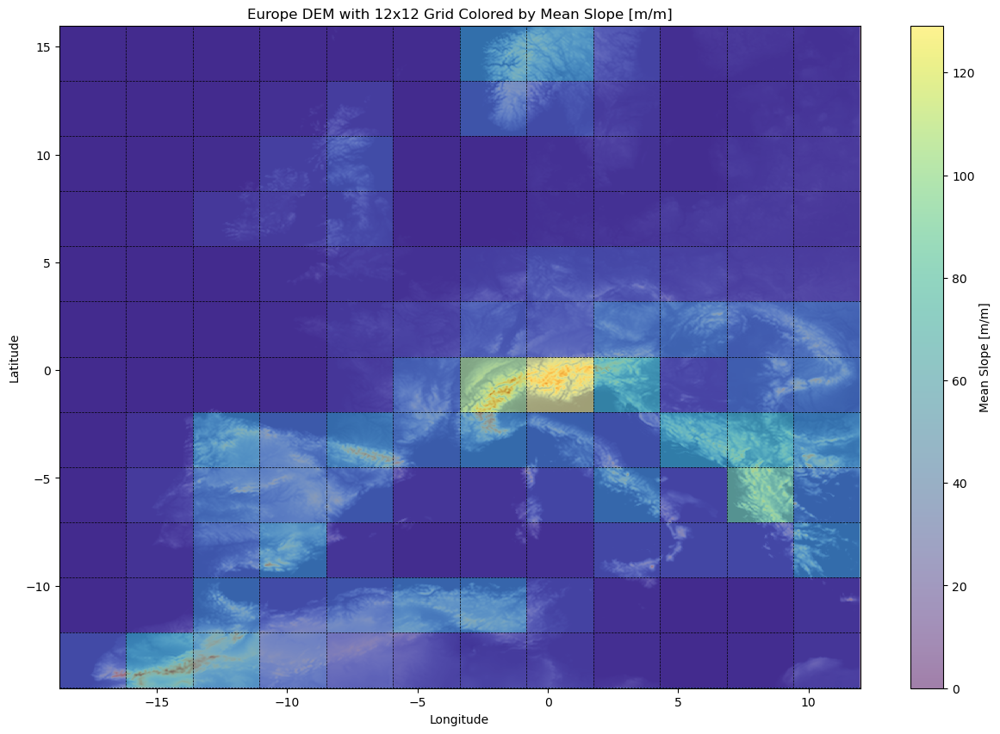

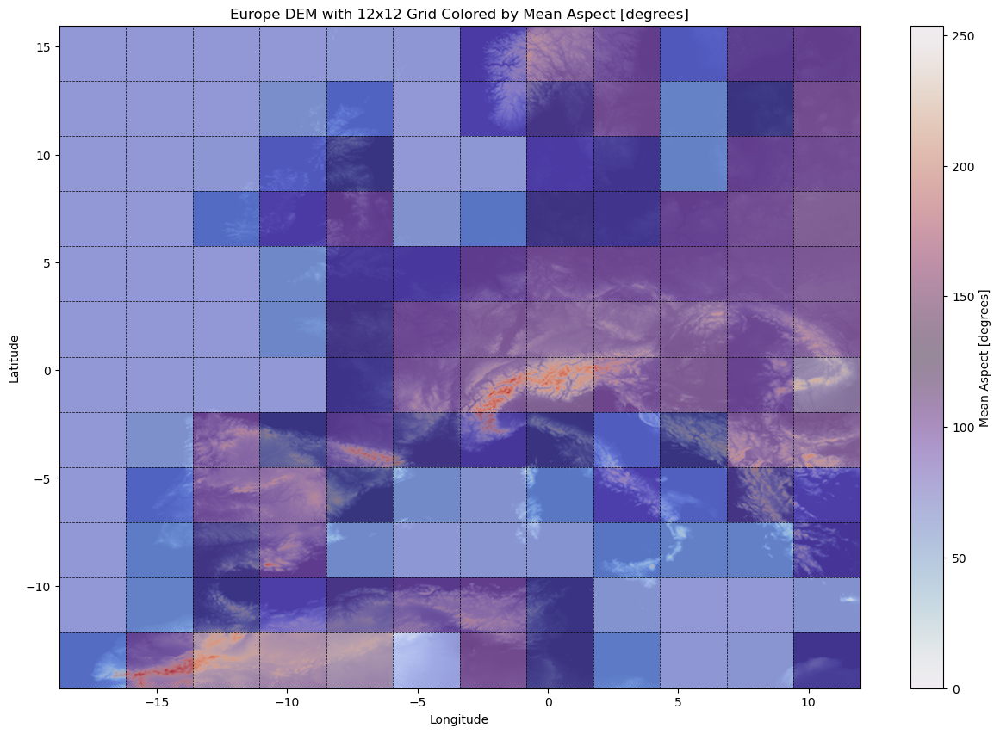

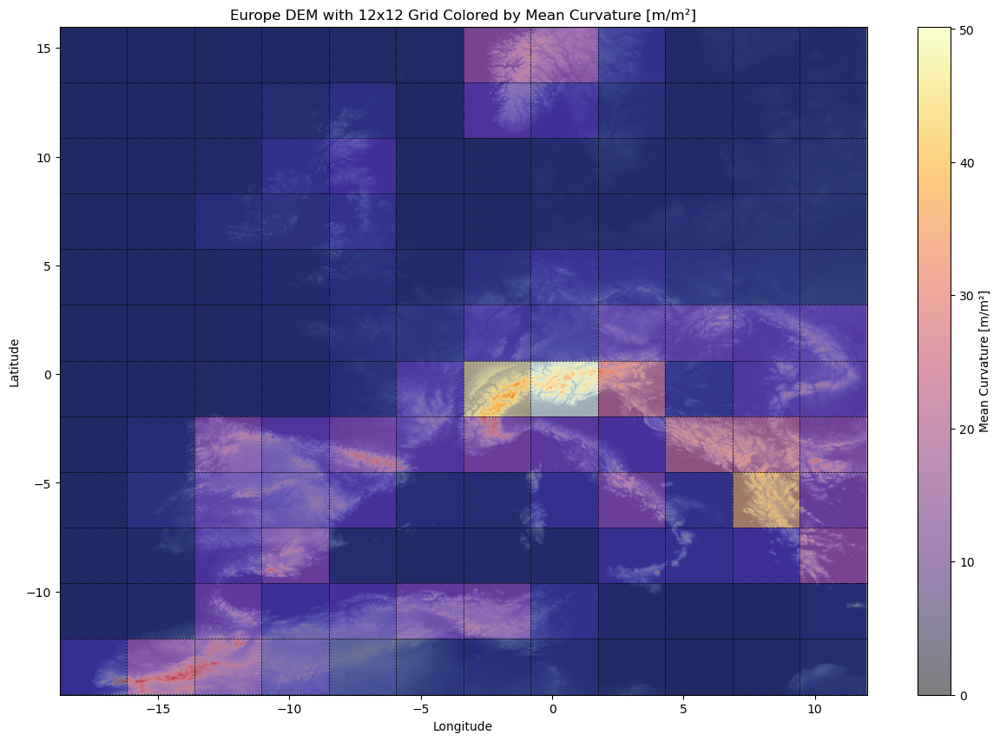

In [100]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Load dataset
data_path = "/Users/fquareng/data/europe_dem_cropped.nc"
ds = xr.open_dataset(data_path, engine="netcdf4")
hsurf = ds.HSURF.sel(time="2095-03-20T18:00:00")

# Determine the extents of the plot
rlon_min, rlon_max = ds.rlon.min().item(), ds.rlon.max().item()
rlat_min, rlat_max = ds.rlat.min().item(), ds.rlat.max().item()

# Define grid properties
num_cells = 12  # 12x12 grid
rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

# Calculate the gradient (slope) in both the x (longitude) and y (latitude) directions
sx, sy = np.gradient(hsurf.values)

# Calculate Slope
slope = np.sqrt(sx**2 + sy**2)

# Calculate Aspect (direction of steepest slope in degrees, 0 = North)
aspect = np.arctan2(sy, sx) * (180 / np.pi)  # Convert radians to degrees
aspect = (aspect + 360) % 360  # Ensure values are between 0 and 360

# Calculate Curvature (second derivative of elevation surface)
slope_x, slope_y = np.gradient(slope, axis=(1, 0))  # First derivative of the slope (gradient)
curvature = np.sqrt(slope_x**2 + slope_y**2)

# Function to calculate the mean value of each metric within each grid cell
def calculate_grid_means(metric_data, num_cells, rlon_min, rlon_max, rlat_min, rlat_max):
    grid_means = np.full((num_cells, num_cells), np.nan)
    
    rlon_grid_spacing = (rlon_max - rlon_min) / num_cells
    rlat_grid_spacing = (rlat_max - rlat_min) / num_cells

    for i in range(num_cells):
        for j in range(num_cells):
            # Define the bounds of the grid cell
            rlon_min_cell = rlon_min + i * rlon_grid_spacing
            rlon_max_cell = rlon_min + (i + 1) * rlon_grid_spacing
            rlat_min_cell = rlat_min + j * rlat_grid_spacing
            rlat_max_cell = rlat_min + (j + 1) * rlat_grid_spacing
            
            # Find the indices of the grid cell in the 2D array
            rlon_mask = (ds.rlon >= rlon_min_cell) & (ds.rlon < rlon_max_cell)
            rlat_mask = (ds.rlat >= rlat_min_cell) & (ds.rlat < rlat_max_cell)
            
            # Apply the masks to the metric data
            cell_data = metric_data[rlat_mask, :][:, rlon_mask]  # Slice the data using boolean masks
            
            # Calculate the mean value for this grid cell
            grid_means[j, i] = cell_data.mean()

    return grid_means

# Calculate the mean value of slope, aspect, and curvature for each grid cell
mean_slope = calculate_grid_means(slope, num_cells, rlon_min, rlon_max, rlat_min, rlat_max)
mean_aspect = calculate_grid_means(aspect, num_cells, rlon_min, rlon_max, rlat_min, rlat_max)
mean_curvature = calculate_grid_means(curvature, num_cells, rlon_min, rlon_max, rlat_min, rlat_max)

# Function to plot the metric with grid cells colored by mean values
def plot_metric(metric_values, title, cmap='coolwarm'):
    plt.figure(figsize=(15, 10))
    plt.pcolormesh(ds.rlon, ds.rlat, hsurf, cmap='coolwarm', shading='auto')  # Plot the DEM in the background
    plt.pcolormesh(ds.rlon[64::128], ds.rlat[64::128], metric_values, cmap=cmap, shading='auto', alpha=0.5)  # Overlay the metric
    plt.colorbar(label=title)
    
    # Add grid lines and labels
    for i, (lon, lat) in enumerate(zip(ds.rlon[::128], ds.rlat[::128])):
        plt.axvline(x=lon, color='black', linestyle='--', linewidth=0.5)
        plt.axhline(y=lat, color='black', linestyle='--', linewidth=0.5)

    # Set labels and title
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title(f'Europe DEM with 12x12 Grid Colored by {title}')
    plt.show()

# Plot Slope (mean value per grid cell)
plot_metric(mean_slope, 'Mean Slope [m/m]', cmap='viridis')

# Plot Aspect (mean value per grid cell)
plot_metric(mean_aspect, 'Mean Aspect [degrees]', cmap='twilight')

# Plot Curvature (mean value per grid cell)
plot_metric(mean_curvature, 'Mean Curvature [m/m²]', cmap='inferno')

# Domain ranking